## Introduction

## Introduction

In [1]:
import os
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.image as mpimg
import pathlib
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Dropout, Flatten, GlobalAveragePooling2D
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.io import read_file
from tensorflow import expand_dims
from tensorflow.image import decode_image, resize
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input
import random
%matplotlib inline
from tensorflow.keras.optimizers import Adam, Adamax

In [2]:
# Show butterfly_classification folder contents
for dirpath, dirnames, filenames in os.walk("butterfly_classification"):
  print(f"There are {len(dirnames)} folder and {len(filenames)} picture in directory {dirpath}")

There are 4 folder and 0 picture in directory butterfly_classification
There are 0 folder and 6 picture in directory butterfly_classification\6 images
There are 16 folder and 0 picture in directory butterfly_classification\test
There are 0 folder and 5 picture in directory butterfly_classification\test\ADONIS
There are 0 folder and 5 picture in directory butterfly_classification\test\APPOLLO
There are 0 folder and 5 picture in directory butterfly_classification\test\ATALA
There are 0 folder and 5 picture in directory butterfly_classification\test\CHESTNUT
There are 0 folder and 5 picture in directory butterfly_classification\test\CLEOPATRA
There are 0 folder and 5 picture in directory butterfly_classification\test\CRECENT
There are 0 folder and 5 picture in directory butterfly_classification\test\JULIA
There are 0 folder and 5 picture in directory butterfly_classification\test\MALACHITE
There are 0 folder and 5 picture in directory butterfly_classification\test\MESTRA
There are 0 folde

In [3]:
def print_in_color(txt_msg,fore_white,back_white,):
    rf,gf,bf=fore_white
    rb,gb,bb=back_white
    msg='{0}' + txt_msg
    mat='\33[38;2;' + str(rf) +';' + str(gf) + ';' + str(bf) + ';48;2;' + str(rb) + ';' +str(gb) + ';' + str(bb) +'m' 
    print(msg .format(mat))

In [4]:
train_dir='butterfly_classification/train/'
dir_list=os.listdir(train_dir)
print(len(dir_list))
msg='{0:8s}{1:4s}{2:^35s}{1:4s}{3:11s}{1:3s}{4:10s}{1:3s}{5:11s}{6}'
msg=msg.format('Class Id', ' ', 'Butterfly Type', 'Train Files','Test Files', 'Valid Files','\n')
print_in_color(msg, (0,255,0), (255,255,255))
species_list= sorted(os.listdir(train_dir))
for i, specie in enumerate (species_list):
    file_path=os.path.join(train_dir,specie)
    train_files_list=os.listdir(file_path)
    train_file_count=str(len(train_files_list))
    msg='{0:^8s}{1:4s}{2:^35s}{1:4s}{3:^11s}{1:3s}{4:^10s}{1:3s}{5:^11s}'
    msg=msg.format(str(i), ' ',specie, train_file_count,'5', '5')
    toggle=i% 2   
    if toggle==0:
        back_color=(0,0,0)
    else:
        back_color=(0, 0, 0)
    print_in_color(msg, (255,0,0), back_color)

16
Class Id              Butterfly Type               Train Files   Test Files   Valid Files

   0                      ADONIS                       126           5             5     
   1                      APPOLLO                      128           5             5     
   2                       ATALA                       143           5             5     
   3                     CHESTNUT                      122           5             5     
   4                     CLEOPATRA                     133           5             5     
   5                      CRECENT                      138           5             5     
   6                       JULIA                       115           5             5     
   7                     MALACHITE                     104           5             5     
   8                      MESTRA                       123           5             5     
   9                     METALMARK                     108           5             5     
   10 

##### - The complete list of the butterfly classification

## Get the data label

In [5]:
data_dir = pathlib.Path("butterfly_classification/train")
class_names = np.array(sorted([item.name for item in data_dir.glob('*')]))
print(class_names)

['ADONIS' 'APPOLLO' 'ATALA' 'CHESTNUT' 'CLEOPATRA' 'CRECENT' 'JULIA'
 'MALACHITE' 'MESTRA' 'METALMARK' 'MONARCH' 'PEACOCK' 'POPINJAY'
 'SOOTYWING' 'ULYSES' 'VICEROY']


## Show Image

In [6]:
def view_random_image(target_dir, target_class):
    target_folder = target_dir + target_class

  
    random_image = random.sample(os.listdir(target_folder), 1)

    img = mpimg.imread(target_folder + "/" + random_image[0])
    plt.imshow(img)
    plt.title(target_class)
    plt.axis("off");

    print(f"Image Size : {img.shape}")
    return img 

Image Size : (224, 224, 3)


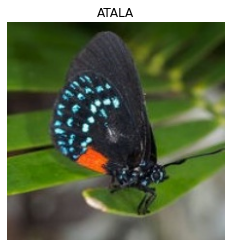

In [116]:
# Viewing random image from butterfly_classification/train/ with ATALA as target class
img = view_random_image(target_dir='butterfly_classification/train/',
                            target_class='ATALA')

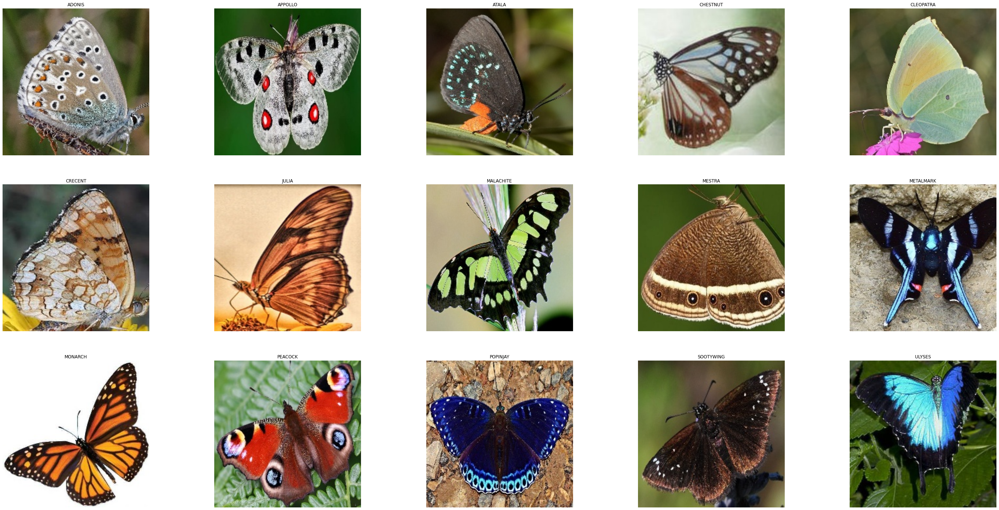

In [8]:
# Viewing one image from each classification in butterfly_classification/valid/
test_dir='butterfly_classification/valid'
classes=len(os.listdir(test_dir))
fig = plt.figure(figsize=(50,25))
if classes % 5==0:
    rows=int(classes/6)
else:
    rows=int(classes/6) +1
for row in range(rows):
    for column in range(5):
        i= row * 5 + column 
        if i>classes-1:
            break            
        specie=species_list[i]
        species_path=os.path.join(test_dir, specie)
        f_path=os.path.join(species_path, '1.jpg')        
        img = mpimg.imread(f_path)
        a = fig.add_subplot(rows, 5, i+1)
        imgplot=plt.imshow(img)
        a.axis("off")
        a.set_title(specie)	

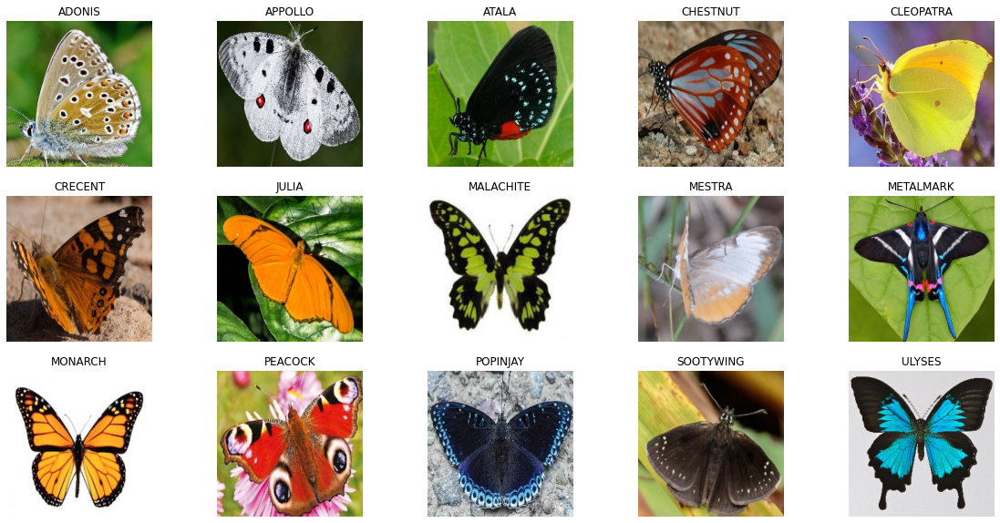

In [9]:
# Viewing one image from each classification in butterfly_classification/test/

test_dir='butterfly_classification/test'
classes=len(os.listdir(test_dir))
fig = plt.figure(figsize=(20,10))
if classes % 5==0:
    rows=int(classes/6)
else:
    rows=int(classes/6) +1
for row in range(rows):
    for column in range(5):
        i= row * 5 + column 
        if i>classes-1:
            break            
        specie=species_list[i]
        species_path=os.path.join(test_dir, specie)
        f_path=os.path.join(species_path, '1.jpg')        
        img = mpimg.imread(f_path)
        a = fig.add_subplot(rows, 5, i+1)
        imgplot=plt.imshow(img)
        a.axis("off")
        a.set_title(specie)	

# **Data Loading**

In [10]:
tf.random.set_seed(44)

# deklarasikan objek
train_datagen = ImageDataGenerator(rescale=1./255)
train_datagen_augmented = ImageDataGenerator(rescale=1./255,
                                             rotation_range=0.2,
                                             zoom_range=0.2,
                                             width_shift_range=0.2,
                                             height_shift_range=0.2,
                                             horizontal_flip=True)
valid_datagen = ImageDataGenerator(rescale=1./255)

# set direktori
train_dir = 'butterfly_classification/train/'
val_dir = 'butterfly_classification/valid/'

# set data generator
train_data = train_datagen.flow_from_directory(train_dir,
                                               batch_size=32,
                                               target_size=(224, 224),
                                               class_mode='categorical',
                                               seed=33)

train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                               batch_size=32,
                                               target_size=(224, 224),
                                               class_mode='categorical',
                                               seed=33)

valid_data = valid_datagen.flow_from_directory(val_dir,
                                               batch_size=32,
                                               target_size=(224, 224),
                                               class_mode='categorical',
                                               seed=33)

Found 1973 images belonging to 16 classes.
Found 1973 images belonging to 16 classes.
Found 80 images belonging to 16 classes.


#### load all the data from butterfly classification folder, from there we can see that we have:
- 1973 image in total belonging to train dataset
- 80 image in total belonging to valid dataset

# **Model Definition**

In [11]:
model = Sequential([
        Conv2D(35, 3, activation='relu', input_shape=(224, 224, 3)),
        Dropout(rate=0.01),
        MaxPool2D(2),
        Conv2D(30, 3, activation='relu'),
        Dropout(rate=0.01),
        MaxPool2D(2),
        Conv2D(25, 3, activation='relu'),
        Dropout(rate=0.01),
        MaxPool2D(2),
        Conv2D(20, 3, activation='relu'),
        Dropout(rate=0.01),
        MaxPool2D(2),
        Conv2D(14, 3, activation='relu'),
        Dropout(rate=0.01),
        MaxPool2D(2),
        Flatten(),
        Dense(16, activation='softmax')
])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 35)      980       
                                                                 
 dropout (Dropout)           (None, 222, 222, 35)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 35)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 30)      9480      
                                                                 
 dropout_1 (Dropout)         (None, 109, 109, 30)      0         
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 30)       0         
 2D)                                                    

# **Model Training**

In [12]:
model.compile(loss='categorical_crossentropy',
              optimizer=Adam(learning_rate=0.001),
              metrics=['accuracy'])

history = model.fit(train_data,
                    epochs=30,
                    validation_data=valid_data)

Epoch 1/30
62/62 [==============================] - 70s 1s/step - loss: 2.6133 - accuracy: 0.1308 - val_loss: 1.9637 - val_accuracy: 0.4000
Epoch 2/30
62/62 [==============================] - 70s 1s/step - loss: 1.5831 - accuracy: 0.4536 - val_loss: 1.4023 - val_accuracy: 0.5000
Epoch 3/30
62/62 [==============================] - 73s 1s/step - loss: 1.1526 - accuracy: 0.6163 - val_loss: 1.0911 - val_accuracy: 0.6375
Epoch 4/30
62/62 [==============================] - 65s 1s/step - loss: 0.9861 - accuracy: 0.6746 - val_loss: 1.0895 - val_accuracy: 0.6625
Epoch 5/30
62/62 [==============================] - 63s 1s/step - loss: 0.8489 - accuracy: 0.7228 - val_loss: 0.8350 - val_accuracy: 0.7375
Epoch 6/30
62/62 [==============================] - 63s 1s/step - loss: 0.7681 - accuracy: 0.7471 - val_loss: 0.7333 - val_accuracy: 0.7375
Epoch 7/30
62/62 [==============================] - 63s 1s/step - loss: 0.6533 - accuracy: 0.7927 - val_loss: 0.6408 - val_accuracy: 0.7375
Epoch 8/30
62/62 [==

<AxesSubplot:>

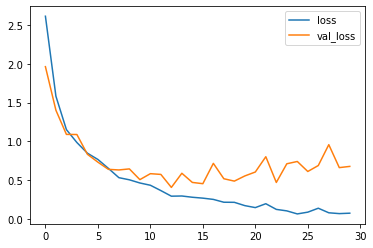

In [90]:
metrics = pd.DataFrame(history.history)
metrics[['loss', 'val_loss']].plot()

<AxesSubplot:>

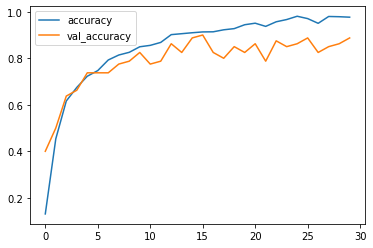

In [14]:
metrics[['accuracy', 'val_accuracy']].plot()

##### from the graph above we can see that the accuracy increases every epoch but the value lose also increase in every epoch

In [117]:
train_data.class_indices # show every classification in the train_data

{'ADONIS': 0,
 'APPOLLO': 1,
 'ATALA': 2,
 'CHESTNUT': 3,
 'CLEOPATRA': 4,
 'CRECENT': 5,
 'JULIA': 6,
 'MALACHITE': 7,
 'MESTRA': 8,
 'METALMARK': 9,
 'MONARCH': 10,
 'PEACOCK': 11,
 'POPINJAY': 12,
 'SOOTYWING': 13,
 'ULYSES': 14,
 'VICEROY': 15}

## Model Evaluation

In [41]:
# Function to process all the image that is not 224x224 yet

def load_and_preprocess(filename, img_shape=224):
  img = read_file(filename)
  img = decode_image(img, channels=3)
  img = resize(img, size=[img_shape, img_shape])
  img = img/255.
  return img

In [45]:
train_data.class_indices

{'ADONIS': 0,
 'APPOLLO': 1,
 'ATALA': 2,
 'CHESTNUT': 3,
 'CLEOPATRA': 4,
 'CRECENT': 5,
 'JULIA': 6,
 'MALACHITE': 7,
 'MESTRA': 8,
 'METALMARK': 9,
 'MONARCH': 10,
 'PEACOCK': 11,
 'POPINJAY': 12,
 'SOOTYWING': 13,
 'ULYSES': 14,
 'VICEROY': 15}

##### Labelling all the data from each category

In [54]:
label= ['ADONIS','APPOLLO', 'ATALA', 'CHESTNUT', 'CLEOPATRA', 'CRECENT', 'JULIA', 'MALACHITE', 'MESTRA', 'METALMARK', 'MONARCH', 'PEACOCK', 'POPINJAY', 'SOOTYWING', 'ULYSES', 'VICEROY']

#### ADONIS

In [110]:
test_img_ADONIS_1 = mpimg.imread('butterfly_classification/test/ADONIS/1.jpg')
test_img_ADONIS_2 = mpimg.imread('butterfly_classification/test/ADONIS/2.jpg')
test_img_ADONIS_3 = mpimg.imread('butterfly_classification/test/ADONIS/3.jpg')
test_img_ADONIS_4 = mpimg.imread('butterfly_classification/test/ADONIS/4.jpg')
test_img_ADONIS_5 = mpimg.imread('butterfly_classification/test/ADONIS/5.jpg')

adonis_list = [test_img_ADONIS_1,test_img_ADONIS_2,test_img_ADONIS_3,test_img_ADONIS_4,test_img_ADONIS_5]

# Importing the data from the corresponding folder

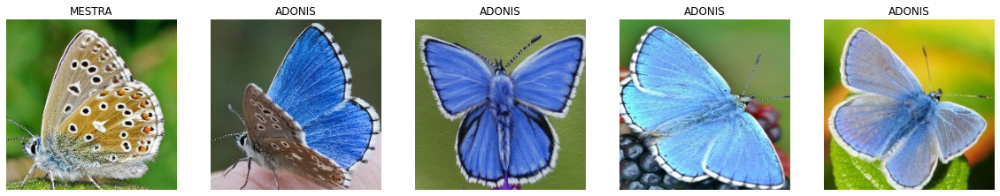

In [109]:
plt.figure(figsize=(20,6))
for i in range (len(adonis_list)):
    plt.subplot(1,5,i+1)
    img = expand_dims(adonis_list[i], axis=0)
    res= model.predict(img).argmax()
    plt.imshow(adonis_list[i])
    plt.title(label[res])
    plt.axis(False)

plt.show()

#####
- the first picture was labeled as MESTRA because ADONIS have a quite distinguishable pattern and blue color like the rest of the image

#### METALMARK

In [57]:
test_img_metalmark_1 = mpimg.imread('butterfly_classification/test/metalmark/1.jpg')
test_img_metalmark_2 = mpimg.imread('butterfly_classification/test/metalmark/2.jpg')
test_img_metalmark_3 = mpimg.imread('butterfly_classification/test/metalmark/3.jpg')
test_img_metalmark_4 = mpimg.imread('butterfly_classification/test/metalmark/4.jpg')
test_img_metalmark_5 = mpimg.imread('butterfly_classification/test/metalmark/5.jpg')

metalmark_list = [test_img_metalmark_1, test_img_metalmark_2, test_img_metalmark_3, test_img_metalmark_4, test_img_metalmark_5]

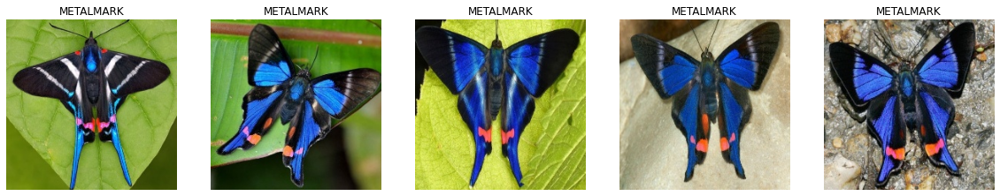

In [58]:
plt.figure(figsize=(20,6))
for i in range (len(metalmark_list)):
    plt.subplot(1,5,i+1)
    img = expand_dims(metalmark_list[i], axis=0)
    res= model.predict(img).argmax()
    plt.imshow(metalmark_list[i])
    plt.title(label[res])
    plt.axis(False)

plt.show()

#####
- All picture succesfully detected as METALMARK because they have the blue and black pattern that maybe no other butterfly have that

#### MESTRA

In [59]:
test_img_mestra_1 = mpimg.imread('butterfly_classification/test/mestra/1.jpg')
test_img_mestra_2 = mpimg.imread('butterfly_classification/test/mestra/2.jpg')
test_img_mestra_3 = mpimg.imread('butterfly_classification/test/mestra/3.jpg')
test_img_mestra_4 = mpimg.imread('butterfly_classification/test/mestra/4.jpg')
test_img_mestra_5 = mpimg.imread('butterfly_classification/test/mestra/5.jpg')

mestra_list = [test_img_mestra_1, test_img_mestra_2, test_img_mestra_3, test_img_mestra_4, test_img_mestra_5]

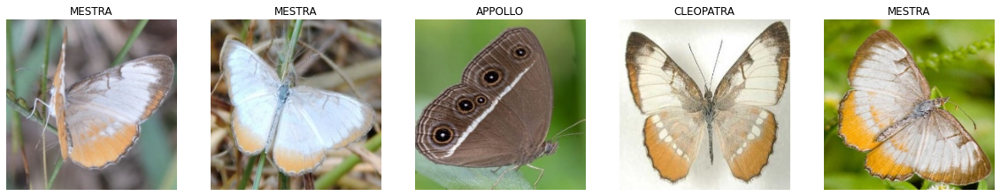

In [60]:
plt.figure(figsize=(20,6))
for i in range (len(mestra_list)):
    plt.subplot(1,5,i+1)
    img = expand_dims(mestra_list[i], axis=0)
    res= model.predict(img).argmax()
    plt.imshow(mestra_list[i])
    plt.title(label[res])
    plt.axis(False)

plt.show()

#####
- The 3rd picture was correctly labelled as apollo, but the 4th picture is actually a MESTRA so the model labelled the image wrong

#### APPOLLO

In [61]:
test_img_appollo_1 = mpimg.imread('butterfly_classification/test/appollo/1.jpg')
test_img_appollo_2 = mpimg.imread('butterfly_classification/test/appollo/2.jpg')
test_img_appollo_3 = mpimg.imread('butterfly_classification/test/appollo/3.jpg')
test_img_appollo_4 = mpimg.imread('butterfly_classification/test/appollo/4.jpg')
test_img_appollo_5 = mpimg.imread('butterfly_classification/test/appollo/5.jpg')

appollo_list = [test_img_appollo_1, test_img_appollo_2, test_img_appollo_3, test_img_appollo_4, test_img_appollo_5]

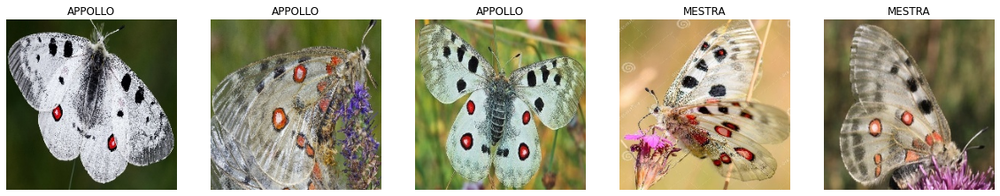

In [62]:
plt.figure(figsize=(20,6))
for i in range (len(appollo_list)):
    plt.subplot(1,5,i+1)
    img = expand_dims(appollo_list[i], axis=0)
    res= model.predict(img).argmax()
    plt.imshow(appollo_list[i])
    plt.title(label[res])
    plt.axis(False)

plt.show()

#####
- The 4th and 5th picture wrongfully labelled as MESTRA because the creamy color that exist in the image that made the model think that they are actually MESTRA not APPOLLO ignoring the fact that they still have that red and black spot

#### CLEOPATRA

In [63]:
test_img_cleopatra_1 = mpimg.imread('butterfly_classification/test/cleopatra/1.jpg')
test_img_cleopatra_2 = mpimg.imread('butterfly_classification/test/cleopatra/2.jpg')
test_img_cleopatra_3 = mpimg.imread('butterfly_classification/test/cleopatra/3.jpg')
test_img_cleopatra_4 = mpimg.imread('butterfly_classification/test/cleopatra/4.jpg')
test_img_cleopatra_5 = mpimg.imread('butterfly_classification/test/cleopatra/5.jpg')

cleopatra_list = [test_img_cleopatra_1, test_img_cleopatra_2, test_img_cleopatra_3, test_img_cleopatra_4, test_img_cleopatra_5]

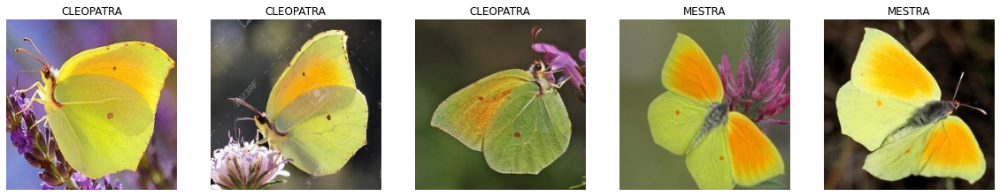

In [64]:
plt.figure(figsize=(20,6))
for i in range (len(cleopatra_list)):
    plt.subplot(1,5,i+1)
    img = expand_dims(cleopatra_list[i], axis=0)
    res= model.predict(img).argmax()
    plt.imshow(cleopatra_list[i])
    plt.title(label[res])
    plt.axis(False)

plt.show()

#####
- The 4th and 5th pick was wrongfully labelled as MESTRA by the model maybe because it look more white than yellow

# **Transfer Learning**

#### Second Model

In [95]:
base = MobileNetV2(weights = 'imagenet', include_top = False, input_shape = (224, 224, 3))
tf.keras.backend.clear_session()
    
for layer in base.layers:
    layer.trainable =  False

mobilenet_model = Sequential()
mobilenet_model.add(base)
mobilenet_model.add(GlobalAveragePooling2D())
mobilenet_model.add(Dense(16, activation='softmax'))

In [96]:
mobilenet_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 16)                20496     
                                                                 
Total params: 2,278,480
Trainable params: 20,496
Non-trainable params: 2,257,984
_________________________________________________________________


In [97]:
mobilenet_model.compile(optimizer=Adam(learning_rate=0.0001),
                        loss='categorical_crossentropy',
                        metrics=['accuracy'])

tl_model = mobilenet_model.fit(train_data_augmented,
                            epochs=30,
                            validation_data=valid_data)  

Epoch 1/30
62/62 [==============================] - 40s 615ms/step - loss: 2.7670 - accuracy: 0.1206 - val_loss: 2.4941 - val_accuracy: 0.2125
Epoch 2/30
62/62 [==============================] - 39s 622ms/step - loss: 2.1827 - accuracy: 0.3401 - val_loss: 2.0224 - val_accuracy: 0.4250
Epoch 3/30
62/62 [==============================] - 38s 616ms/step - loss: 1.7408 - accuracy: 0.5580 - val_loss: 1.6670 - val_accuracy: 0.6250
Epoch 4/30
62/62 [==============================] - 38s 618ms/step - loss: 1.4014 - accuracy: 0.6994 - val_loss: 1.4048 - val_accuracy: 0.6625
Epoch 5/30
62/62 [==============================] - 39s 625ms/step - loss: 1.1670 - accuracy: 0.7663 - val_loss: 1.2052 - val_accuracy: 0.7125
Epoch 6/30
62/62 [==============================] - 39s 623ms/step - loss: 0.9981 - accuracy: 0.8216 - val_loss: 1.0512 - val_accuracy: 0.7875
Epoch 7/30
62/62 [==============================] - 38s 615ms/step - loss: 0.8666 - accuracy: 0.8292 - val_loss: 0.9389 - val_accuracy: 0.8375

<AxesSubplot:>

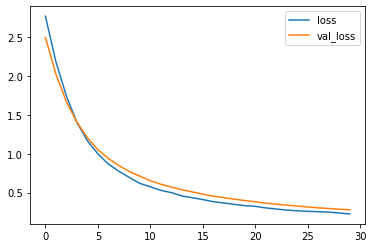

In [98]:
metrics_2 = pd.DataFrame(tl_model.history)
metrics_2[['loss', 'val_loss']].plot()

<AxesSubplot:>

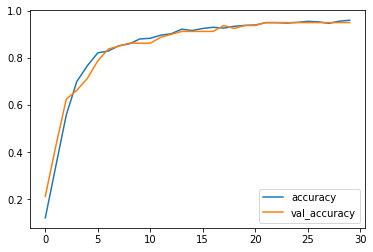

In [99]:
metrics_2[['accuracy', 'val_accuracy']].plot()

##### As we can see from the model improvement the lose is also decreasing while the accuracy increase 

# **Model Evaluation Transfer Learning**

#### ADONIS

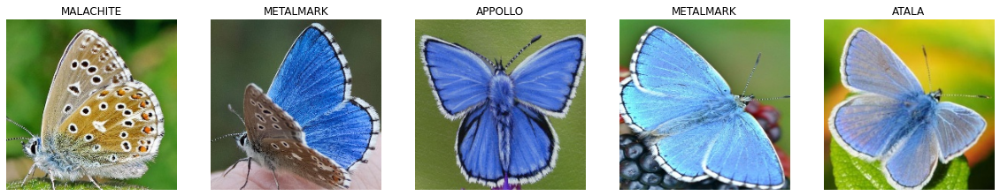

In [102]:
plt.figure(figsize=(20,6))
for i in range (len(adonis_list)):
    plt.subplot(1,5,i+1)
    img = expand_dims(adonis_list[i], axis=0)
    res= mobilenet_model.predict(img).argmax()
    plt.imshow(adonis_list[i])
    plt.title(label[res])
    plt.axis(False)
    
    

plt.show()

#####
- This model eventho we get a better accuracy and lose can't correctly labelled ADONIS butterfly

#### METALMARK

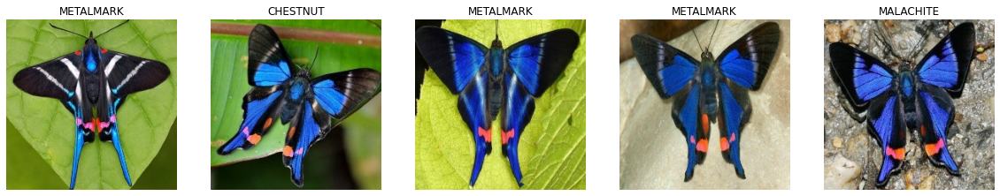

In [103]:
plt.figure(figsize=(20,6))
for i in range (len(metalmark_list)):
    plt.subplot(1,5,i+1)
    img = expand_dims(metalmark_list[i], axis=0)
    res= mobilenet_model.predict(img).argmax()
    plt.imshow(metalmark_list[i])
    plt.title(label[res])
    plt.axis(False)

plt.show()

#####
- The 2nd and 5th image was not correctly labelled by the model maybe because of background and different angle the image is taken from

#### MESTRA

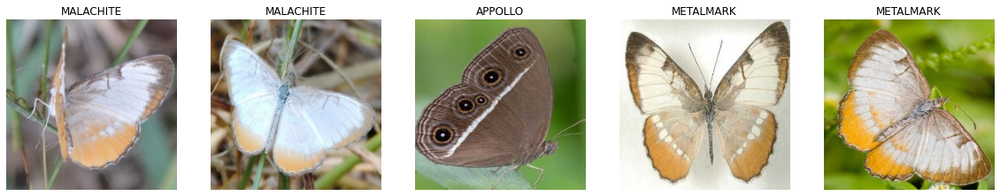

In [104]:
plt.figure(figsize=(20,6))
for i in range (len(mestra_list)):
    plt.subplot(1,5,i+1)
    img = expand_dims(mestra_list[i], axis=0)
    res= mobilenet_model.predict(img).argmax()
    plt.imshow(mestra_list[i])
    plt.title(label[res])
    plt.axis(False)

plt.show()

#####
- Its also seems like this model cant predict MESTRA

#### APPOLLO

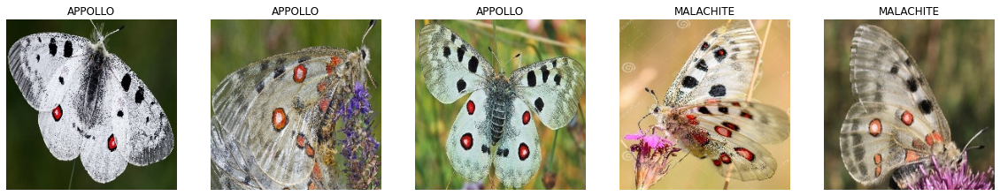

In [105]:
plt.figure(figsize=(20,6))
for i in range (len(appollo_list)):
    plt.subplot(1,5,i+1)
    img = expand_dims(appollo_list[i], axis=0)
    res= mobilenet_model.predict(img).argmax()
    plt.imshow(appollo_list[i])
    plt.title(label[res])
    plt.axis(False)

plt.show()

#### CLEOPATRA

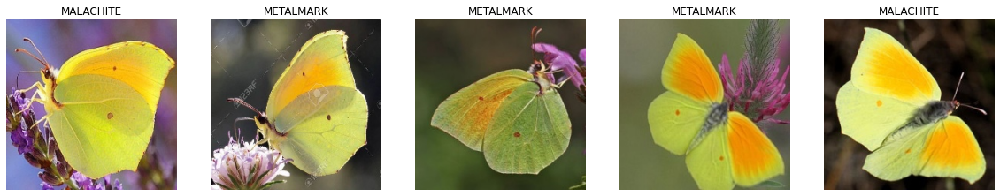

In [106]:
plt.figure(figsize=(20,6))
for i in range (len(cleopatra_list)):
    plt.subplot(1,5,i+1)
    img = expand_dims(cleopatra_list[i], axis=0)
    res= mobilenet_model.predict(img).argmax()
    plt.imshow(cleopatra_list[i])
    plt.title(label[res])
    plt.axis(False)

plt.show()

# **Model Inference**

In [122]:
inf_img_adonis = mpimg.imread('adonis.jpg')
inf_img_appollo = mpimg.imread('download.jpg')
inf_img_cleopatra = mpimg.imread('Gonepteryx.cleopatra.mounted.jpg')
inf_img_mestra = mpimg.imread('mestra.jpg')
inf_img_metalmark = mpimg.imread('metalmark.jpg')


inf_list = [inf_img_adonis, inf_img_appollo, inf_img_cleopatra, inf_img_mestra, inf_img_metalmark]

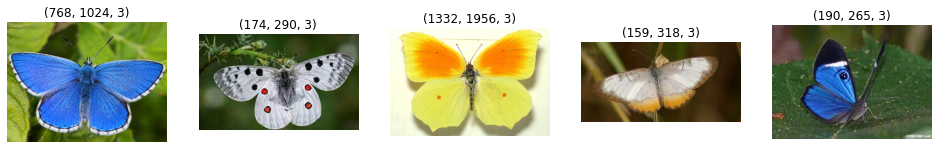

In [124]:
plt.figure(figsize=(20,6))
for i in range (len(inf_list)):
    plt.subplot(1,6,i+1)
    plt.imshow(inf_list[i])
    plt.title(inf_list[i].shape)
    plt.axis(False)

In [126]:
inf_img_adonis = load_and_preprocess('adonis.jpg')
inf_img_appollo = load_and_preprocess('download.jpg')
inf_img_cleopatra = load_and_preprocess('Gonepteryx.cleopatra.mounted.jpg')
inf_img_mestra = load_and_preprocess('mestra.jpg')
inf_img_metalmark = load_and_preprocess('metalmark.jpg')


inf_list_improved = [inf_img_adonis, inf_img_appollo, inf_img_cleopatra, inf_img_mestra, inf_img_metalmark]

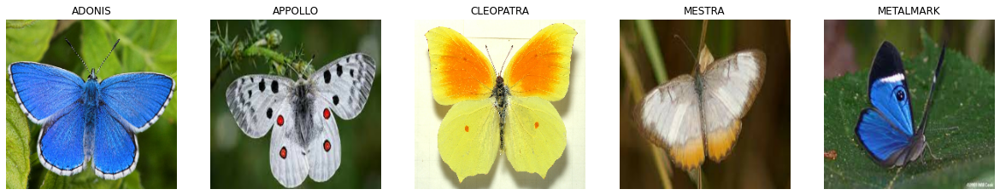

In [129]:
plt.figure(figsize=(25,6))
for i in range (len(inf_list_improved)):
    plt.subplot(1,6,i+1)
    img = expand_dims(inf_list_improved[i], axis=0)
    res= mobilenet_model.predict(img).argmax()
    plt.imshow(inf_list_improved[i])
    plt.title(label[res])
    plt.axis(False)